In [1]:
train_data = './data/train'
train_labels = './data/train.csv'
val_data = './data/val'
val_labels = './data/val.csv'

In [2]:
from utilities import GestureDataGenerator, visualize_mediapipe_processing, plot_training_history, set_seed, get_callbacks, checks_and_balances
checks_and_balances()
set_seed(seed=42)

Random seed set to 42


In [3]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Input, TimeDistributed, Flatten, GRU, Dropout, Dense

def build_gru_model(sequence_length: int, num_keypoints: int, num_features: int, num_classes: int) -> Sequential:
    """
    Builds a GRU-based model for gesture recognition using Sequential-style design.

    Args:
        sequence_length (int): Number of frames in the sequence.
        num_keypoints (int): Number of keypoints per frame (e.g., 21 for MediaPipe Hands).
        num_features (int): Features per keypoint (e.g., 3 for x, y, z coordinates).
        num_classes (int): Number of gesture classes for classification.

    Returns:
        Sequential: A compiled GRU-based Sequential model.
    """
    model = Sequential([
        # Input layer with the shape (sequence_length, num_keypoints, num_features)
        Input(shape=(sequence_length, num_keypoints, num_features), name="Input_Layer"),
        
        # Flatten keypoints per frame using TimeDistributed
        TimeDistributed(Flatten(), name="Flatten_Keypoints"),
        
        # GRU Layer with dropout for regularization
        GRU(64, return_sequences=False, name="GRU_Layer"),
        Dropout(0.5, name="Dropout_Layer"),
        
        # Dense output layer for classification
        Dense(num_classes, activation="softmax", name="Output_Layer")
    ], name="GRU_Gesture_Model")

    # Compile the model
    model.compile(
        optimizer="adam",
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )
    
    model.summary()

    return model

In [4]:
# Parameters
batch_size = 128            # Our model is light comparatively as data pipeline reduces data to (21,3)
sequence_length = 30
image_size = (256, 256)
num_classes = 5

# Generators
train_generator = GestureDataGenerator(
    data_path=train_data,
    labels_csv=train_labels,
    batch_size=batch_size,
    image_size=image_size,
    sequence_length=sequence_length,
    shuffle=True,
    use_mediapipe=True,         # Use MediaPipe keypoints
    # workers=4,                  # Number of worker processes
    # use_multiprocessing=True,   # Enable multiprocessing
    # max_queue_size=6  
)

val_generator = GestureDataGenerator(
    data_path=val_data,
    labels_csv=val_labels,
    batch_size=batch_size,
    image_size=image_size,
    sequence_length=sequence_length,
    use_mediapipe=True,         # Use MediaPipe keypoints
    # workers=4,                  # Number of worker processes
    # use_multiprocessing=True,   # Enable multiprocessing
    # max_queue_size=6  
)

6 batches created, each of size 128, with 663 sequences of 30 images each. Use MediaPipe: True
1 batches created, each of size 128, with 100 sequences of 30 images each. Use MediaPipe: True


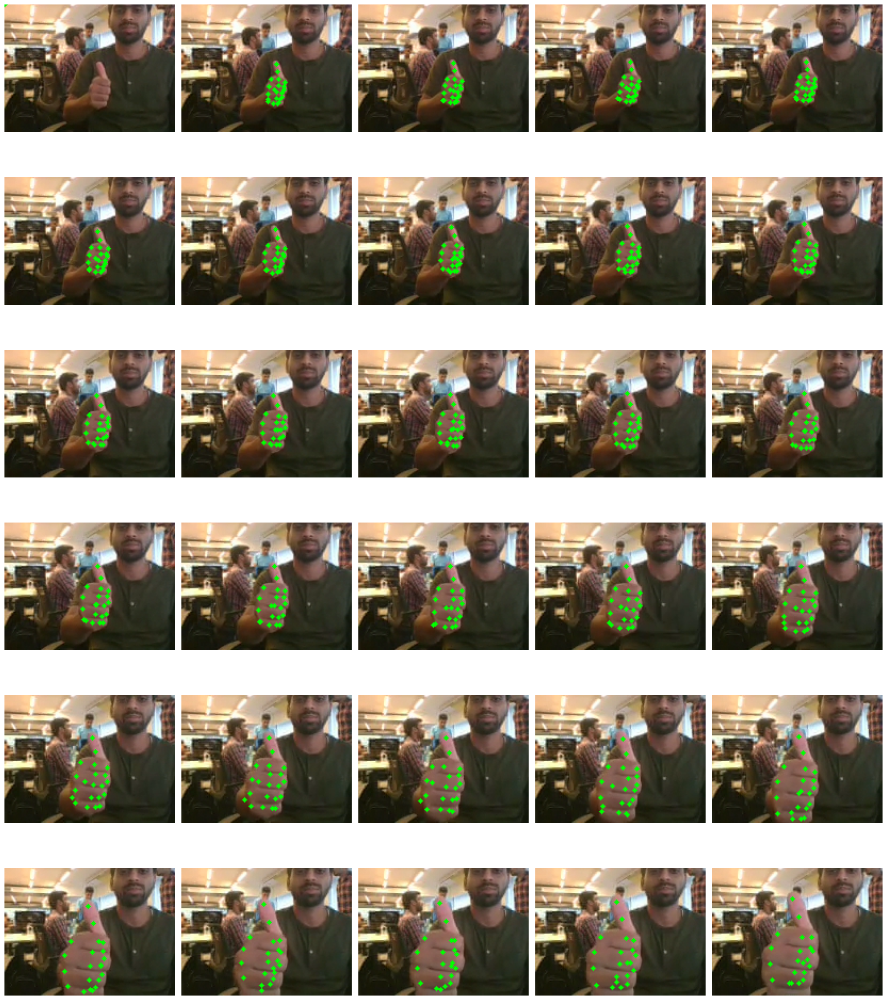

In [5]:
visualize_mediapipe_processing(train_generator)

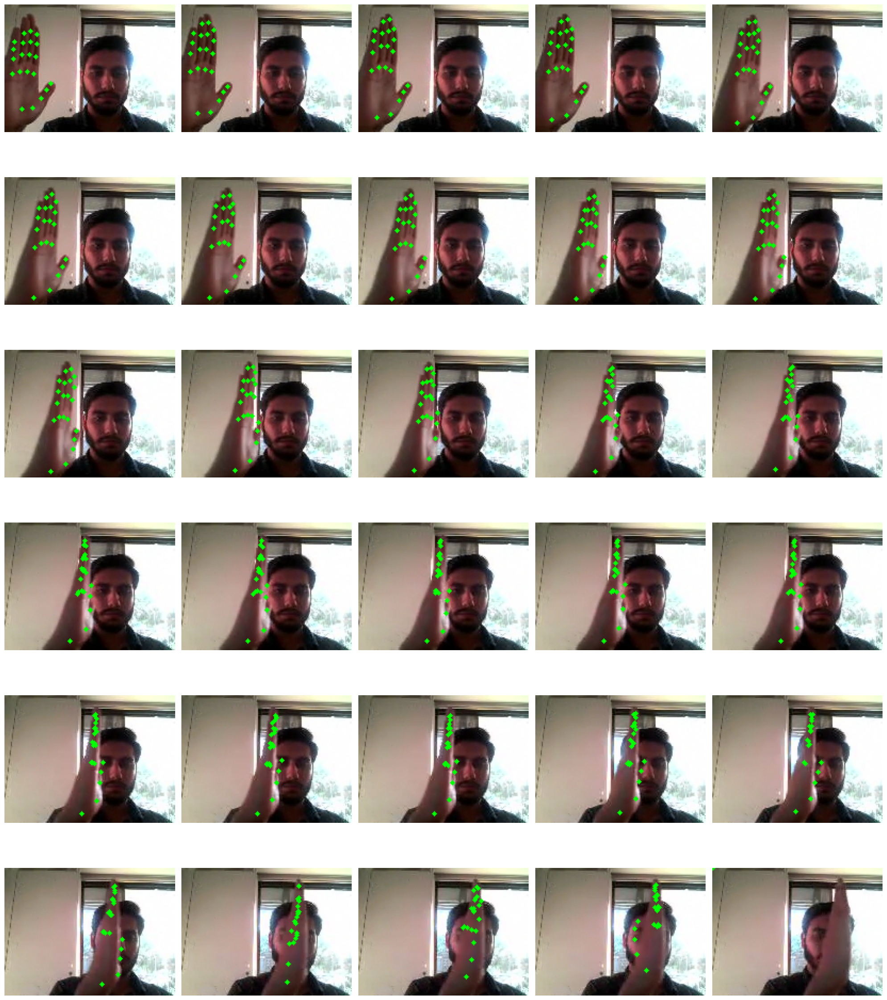

In [6]:
visualize_mediapipe_processing(train_generator)

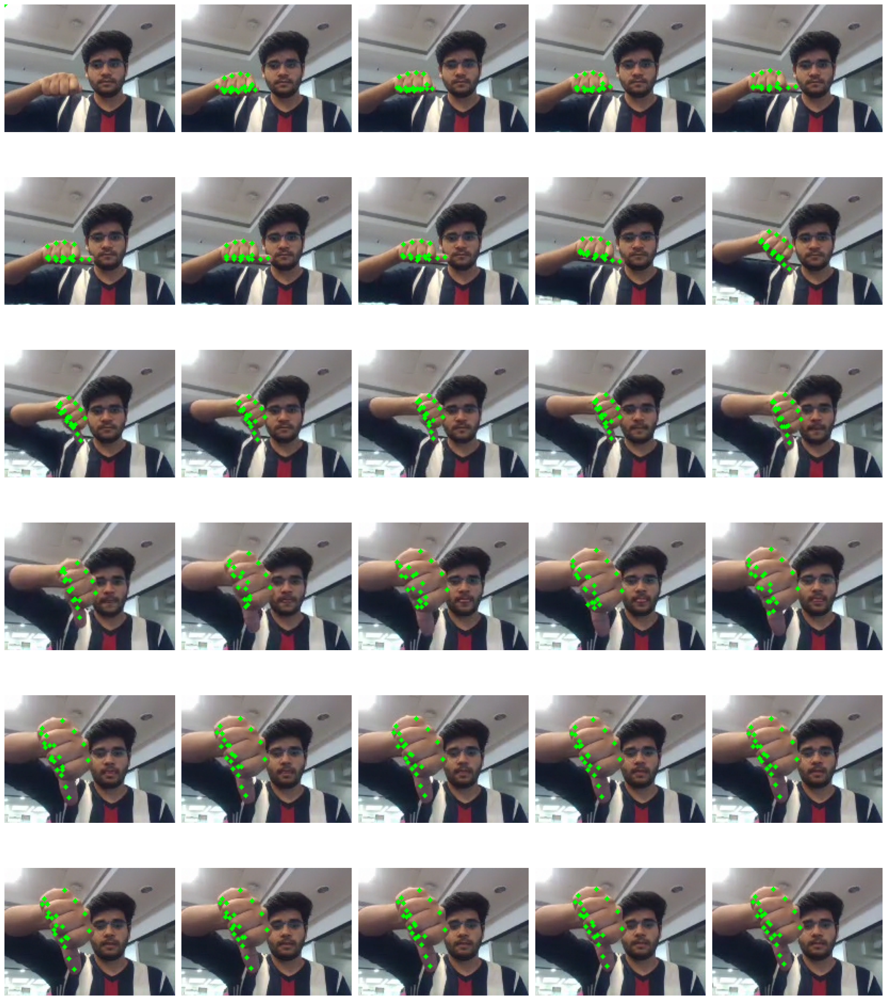

In [7]:
visualize_mediapipe_processing(train_generator)

In [5]:
# Model
sequence_length = train_generator.sequence_length
num_keypoints = 21
num_features = 3
num_classes = train_generator.num_classes

model = build_gru_model(sequence_length, num_keypoints, num_features, num_classes)

Model: "GRU_Gesture_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Flatten_Keypoints               │ (None, 30, 63)         │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ GRU_Layer (GRU)                 │ (None, 64)             │        24,768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dropout_Layer (Dropout)         │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output_Layer (Dense)            │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,093 (98.02 KB)

 Trainable params: 25,093 (98.02 KB)

 Non-trainable params: 0 (0.00 B)

In [6]:
model_save_location = 'best-models/pretrained-mediapipe+gru'

In [7]:
checkpoint_callback, reduce_lr_callback, early_stopping_callback = get_callbacks(filepath = model_save_location)

Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 503s 83s/step - accuracy: 0.2203 - loss: 1.6503 - val_accuracy: 0.2800 - val_loss: 1.5059 - learning_rate: 0.0010
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 356s 59s/step - accuracy: 0.3372 - loss: 1.5076 - val_accuracy: 0.6200 - val_loss: 1.3977 - learning_rate: 0.0010
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 304s 51s/step - accuracy: 0.4620 - loss: 1.3897 - val_accuracy: 0.7200 - val_loss: 1.2858 - learning_rate: 0.0010
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 312s 52s/step - accuracy: 0.5755 - loss: 1.2890 - val_accuracy: 0.7600 - val_loss: 1.1694 - learning_rate: 0.0010
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 298s 49s/step - accuracy: 0.6459 - loss: 1.1868 - val_accuracy: 0.8400 - val_loss: 1.0460 - learning_rate: 0.0010
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 357s 70s/step - accuracy: 0.7345 - loss: 1.0304 - val_accuracy: 0.7800 - val_loss: 0.9236 - learning_rate: 0.0010
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 449s 73s/step - accuracy: 0.7399 - loss: 0.9292 - val_accuracy: 

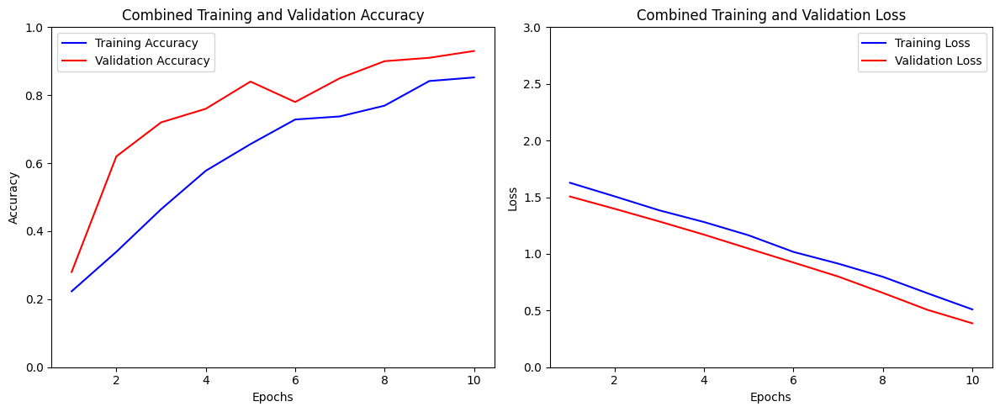

In [8]:
# Train the model
history_1 = model.fit(
    x=train_generator,
    validation_data=val_generator,
    epochs=10,
    callbacks=[checkpoint_callback, reduce_lr_callback, early_stopping_callback],
    verbose=1
)

plot_training_history(histories=[history_1])

Epoch 11/25
6/6 ━━━━━━━━━━━━━━━━━━━━ 349s 60s/step - accuracy: 0.8637 - loss: 0.4158 - val_accuracy: 0.9300 - val_loss: 0.3186 - learning_rate: 0.0010
Epoch 12/25
6/6 ━━━━━━━━━━━━━━━━━━━━ 413s 71s/step - accuracy: 0.9092 - loss: 0.3310 - val_accuracy: 0.9400 - val_loss: 0.2683 - learning_rate: 0.0010
Epoch 13/25
6/6 ━━━━━━━━━━━━━━━━━━━━ 341s 66s/step - accuracy: 0.8717 - loss: 0.3228 - val_accuracy: 0.9300 - val_loss: 0.2631 - learning_rate: 0.0010
Epoch 14/25
6/6 ━━━━━━━━━━━━━━━━━━━━ 342s 58s/step - accuracy: 0.9125 - loss: 0.2750 - val_accuracy: 0.9400 - val_loss: 0.1945 - learning_rate: 0.0010
Epoch 15/25
6/6 ━━━━━━━━━━━━━━━━━━━━ 402s 66s/step - accuracy: 0.9209 - loss: 0.2292 - val_accuracy: 0.9500 - val_loss: 0.1421 - learning_rate: 0.0010
Epoch 16/25
6/6 ━━━━━━━━━━━━━━━━━━━━ 301s 50s/step - accuracy: 0.9053 - loss: 0.2440 - val_accuracy: 0.9400 - val_loss: 0.2741 - learning_rate: 0.0010
Epoch 17/25
6/6 ━━━━━━━━━━━━━━━━━━━━ 387s 65s/step - accuracy: 0.8973 - loss: 0.2529 - val_acc

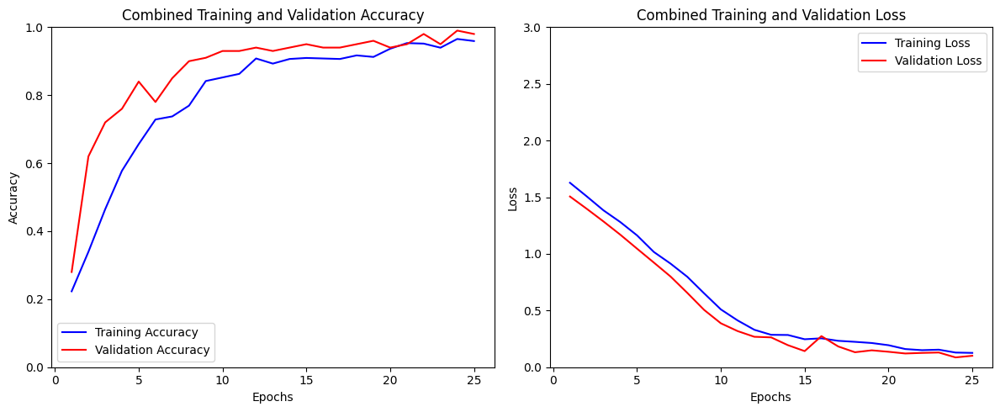

In [10]:
model.load_weights(f'{model_save_location}.keras')

# Train the model for more epochs
history_2 = model.fit(
    x=train_generator,
    validation_data=val_generator,
    epochs=25,                   # Train for more epochs
    initial_epoch=10,            # Start counting previous epochs
    callbacks=[checkpoint_callback, reduce_lr_callback, early_stopping_callback],
    verbose=1
)

plot_training_history(histories=[history_1, history_2])

In [ ]:
model.load_weights(f'{model_save_location}.keras')

evaluation_results = model.evaluate(val_generator, verbose=1)

for metric, value in zip(model.metrics_names, evaluation_results):
    print(f"{metric}: {value:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 39s 39s/step - accuracy: 0.9900 - loss: 0.0864
loss: 0.0864
compile_metrics: 0.9900


In [ ]:
model.load_weights(f'{model_save_location}.keras')

evaluation_results = model.evaluate(train_generator, verbose=1)

for metric, value in zip(model.metrics_names, evaluation_results):
    print(f"{metric}: {value:.4f}")

6/6 ━━━━━━━━━━━━━━━━━━━━ 342s 58s/step - accuracy: 0.9550 - loss: 0.1163
loss: 0.1129
compile_metrics: 0.9608
